In [1]:
import pandas as pd
import numpy as np
import os
import cv2
import sys
import matplotlib
import scipy
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns
from tifffile import imread
from glob import glob
from scipy.stats import mode
from collections import Counter
import math
import skimage
from skimage import morphology
from skimage import io
import re
from itertools import chain
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
import networkx as nx
from stardist.models import StarDist2D
from csbdeep.utils import normalize
from sklearn.linear_model import LinearRegression

sys.path.append("./")
import analysis as an
from importlib import reload

2024-03-10 15:20:14.259619: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-10 15:20:14.302275: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-10 15:20:14.302329: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-10 15:20:14.304034: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-10 15:20:14.311959: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-10 15:20:14.312834: I tensorflow/core/platform/cpu_feature_guard.cc:1

In [2]:
img_dir = "/nfs/turbo/umms-indikar/shared/projects/wound_healing/data/AWH02/Cropped_images/"

imgs = {}
bab_imgs = {}
man_imgs = {}

for f in os.listdir(img_dir):
    label = f.split(".")[0]
    fullPath = f"{img_dir}{f}"
    img = skimage.io.imread(fullPath, as_gray=True) 
    imgs[label] = img.T
    #print(f"{label} {img.shape=}")
    
print('done')
   
for f in os.listdir(img_dir):
    label = f.split(".")[0]
    if label.startswith("AWH02_BAB"):
        fullPath = f"{img_dir}{f}"
        img = skimage.io.imread(fullPath, as_gray=True) 
        bab_imgs[label] = img.T
        #print(f"{label} {img.shape=}")
    if label.startswith("AWH02_MAN"):
        fullPath = f"{img_dir}{f}"
        img = skimage.io.imread(fullPath, as_gray=True) 
        man_imgs[label] = img.T
        #print(f"{label} {img.shape=}")

print('done')

TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames

done


TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames, got 2
TiffFrame 1: missing required tags
OME series: expected 1 frames

done


In [3]:
## All images have size 600, 600
cropped_imgs = {}

for i, (label, image) in enumerate(imgs.items()):
    #print(label, image.shape)
    
    if label.startswith("AWH02_BAB"):
        #crop = image[300:1000, 0:698]
        crop = image[310:910, 50:650]
        cropped_imgs[label] = crop
        
    if label.startswith("AWH02_BAB_crop_s2"):
        #crop = image[300:1000, 0:698]
        crop = image[400:1000, 50:650]
        cropped_imgs[label] = crop
        
    if label.startswith("AWH02_MAN_crop_guide"):
        # crop = image[450:1150, 0:698]
        crop = image[500:1100, 0:600]
        cropped_imgs[label] = crop
    
    if label.startswith("AWH02_MAN_crop_noguide"):
        # crop = image[450:1150, 52:750]
        crop = image[500:1100, 110:710]
        cropped_imgs[label] = crop
        
    if label.startswith("AWH02_MAN_crop_noguide_s6"):
        # crop = image[450:1150, 52:750]
        crop = image[500:1100, 150:750]
        cropped_imgs[label] = crop

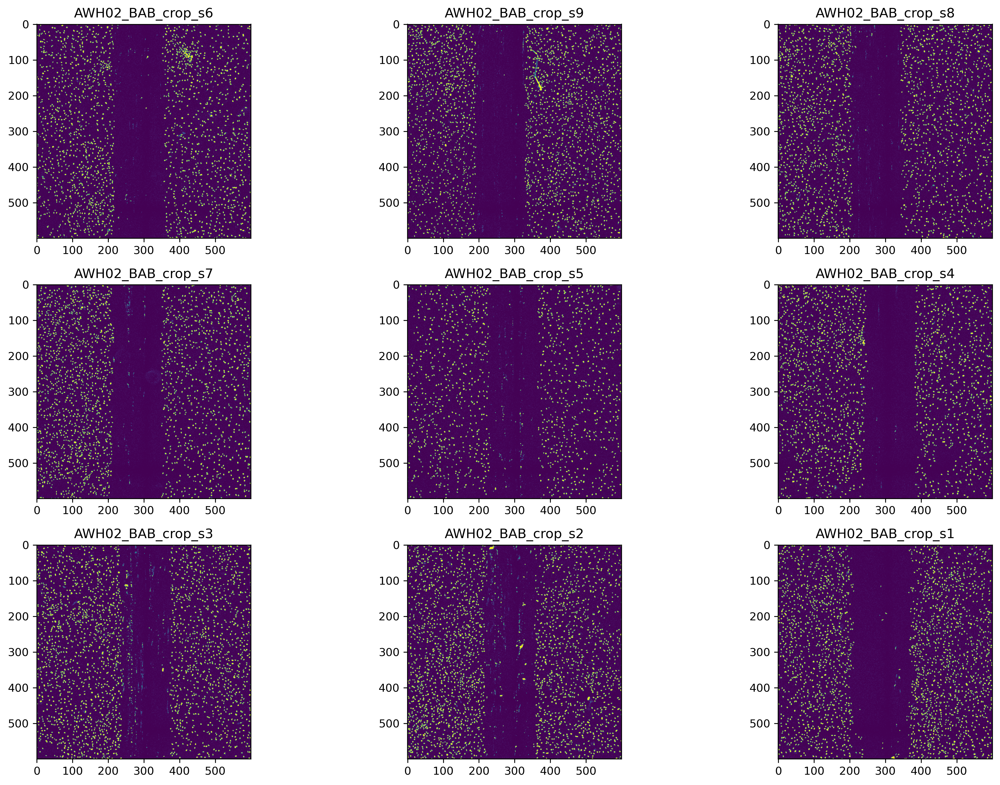

In [6]:
to_plot = [
    'AWH02_BAB_crop_s6', 
    'AWH02_BAB_crop_s9', 
    'AWH02_BAB_crop_s8',
    'AWH02_BAB_crop_s7',
    'AWH02_BAB_crop_s5', 
    'AWH02_BAB_crop_s4',
    'AWH02_BAB_crop_s3',
    'AWH02_BAB_crop_s2',
    'AWH02_BAB_crop_s1',
]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 10
fig, axs = plt.subplots(3, 3)
axs = axs.ravel()

for i, key in enumerate(to_plot):
    image = cropped_imgs[key]
    axs[i].imshow(image)#, vmin=0, vmax=1)
    axs[i].set_title(key)
    #axs[i].set_xticks([])
    #axs[i].set_yticks([])
    axs[i].set_facecolor("white")

plt.tight_layout()

In [4]:
def filter_cell(nucLabels, data, nn=20, q=0.995):
    """A function to filter segemented cells based on
    their distance to the closest `nn` other cells

    args:
        : nucLabels (np.array): a 2D array with cell labels
        : nn (int): the number of closest cells over which distance
            is averaged
        : q (float): the threshold used to determine if a
            cell is excluded. lowerr threshold excludes more cells

    returns:
        filtered (np.array): a filtered 2D array where cell labels
            that are excluded are dropped
    """
    from sklearn.neighbors import NearestNeighbors

    # building a dataframe of cell positions and predicted probabilities
    dp = pd.DataFrame(data['points'], columns=['y', 'x'])
    dp['prob'] = data['prob']
   
    # get the nearest neighbors to each cell
    nbrs = NearestNeighbors(n_neighbors=nn)
    nbrs.fit(dp[['x', 'y']])
    distances, indices = nbrs.kneighbors(X=dp[['x', 'y']]) # extract the nearest neighbors
   
    # compute the average distance to the `nn` nearest neighbors
    dp['mean_dist'] = np.mean(distances, axis=1)
   
    # threshold points that are "isolated" from nearby cells based on the distribution
    # of distances
    dp['is_isolated'] = dp['mean_dist'] > np.quantile(dp['mean_dist'], q)
   
    # get the index of the cells to keep
    # WARNING labels are the index + 1 !!!!!
    indices_to_drop = dp[dp['is_isolated']].index + 1
   
    # set excluded cells to the background color (zero)
    mask = np.isin(nucLabels, indices_to_drop)
    filtered = nucLabels.copy()
    filtered[mask] = 0
    return filtered, dp

#---------------------------------------------------------------------------------------------------

#p = 0.5 # probability for segementation, high is more strict
p = 0.5
model = StarDist2D.from_pretrained('2D_versatile_fluo')

segments = {}

for i, (label, image) in enumerate(cropped_imgs.items()):
    print(label, image.shape)

    nucLabels, data = model.predict_instances(normalize(image), prob_thresh=p)
    filtered, dp = filter_cell(nucLabels, data, nn=30, q=0.995)#nn=50, q=0.97)#nn=20, q=0.96)
    segments[label] = filtered

print('done')

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
AWH02_MAN_crop_noguide_s5 (600, 600)
AWH02_MAN_crop_guide_s30 (600, 600)
AWH02_BAB_crop_s7 (600, 600)
AWH02_MAN_crop_guide_s17 (600, 600)
AWH02_MAN_crop_noguide_s11 (600, 600)
AWH02_MAN_crop_noguide_s9 (600, 600)
AWH02_MAN_crop_guide_s32 (600, 600)
AWH02_MAN_crop_guide_s25 (600, 600)
AWH02_MAN_crop_noguide_s2 (600, 600)
AWH02_BAB_crop_s1 (600, 600)
AWH02_MAN_crop_noguide_s14 (600, 600)
AWH02_MAN_crop_noguide_s13 (600, 600)
AWH02_MAN_crop_noguide_s3 (600, 600)
AWH02_MAN_crop_guide_s29 (600, 600)
AWH02_MAN_crop_noguide_s15 (600, 600)
AWH02_MAN_crop_noguide_s7 (600, 600)
AWH02_BAB_crop_s4 (600, 600)
AWH02_MAN_crop_noguide_s6 (600, 600)
AWH02_MAN_crop_guide_s24 (600, 600)
AWH02_BAB_crop_s3 (600, 600)
AWH02_MAN_crop_guide_s19 (600, 600)
AWH02_MAN_crop_guide_s18 (600, 600)
AWH02_MAN_crop_noguid

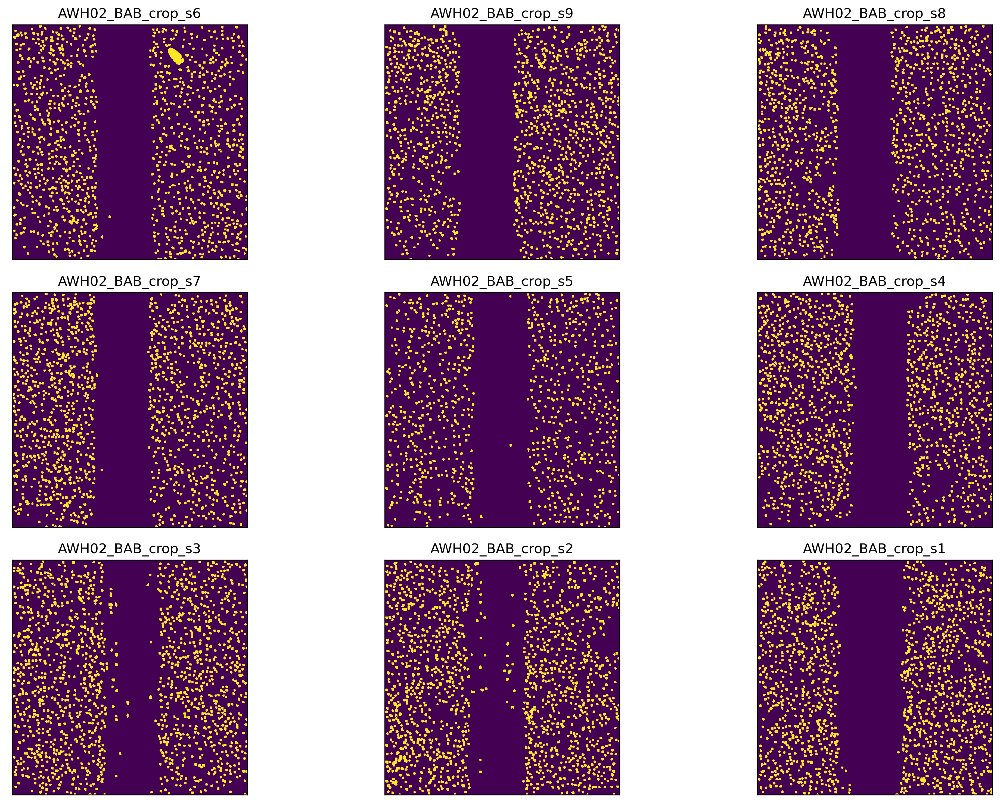

In [32]:
to_plot = [
    'AWH02_BAB_crop_s6', 
    'AWH02_BAB_crop_s9', 
    'AWH02_BAB_crop_s8',
    'AWH02_BAB_crop_s7',
    'AWH02_BAB_crop_s5', 
    'AWH02_BAB_crop_s4',
    'AWH02_BAB_crop_s3',
    'AWH02_BAB_crop_s2',
    'AWH02_BAB_crop_s1',
]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 10
fig, axs = plt.subplots(3, 3)
axs = axs.ravel()

for i, key in enumerate(to_plot):
    image = segments[key]
    axs[i].imshow(image, vmin=0, vmax=1)
    axs[i].set_title(key)
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[i].set_facecolor("white")

plt.tight_layout()

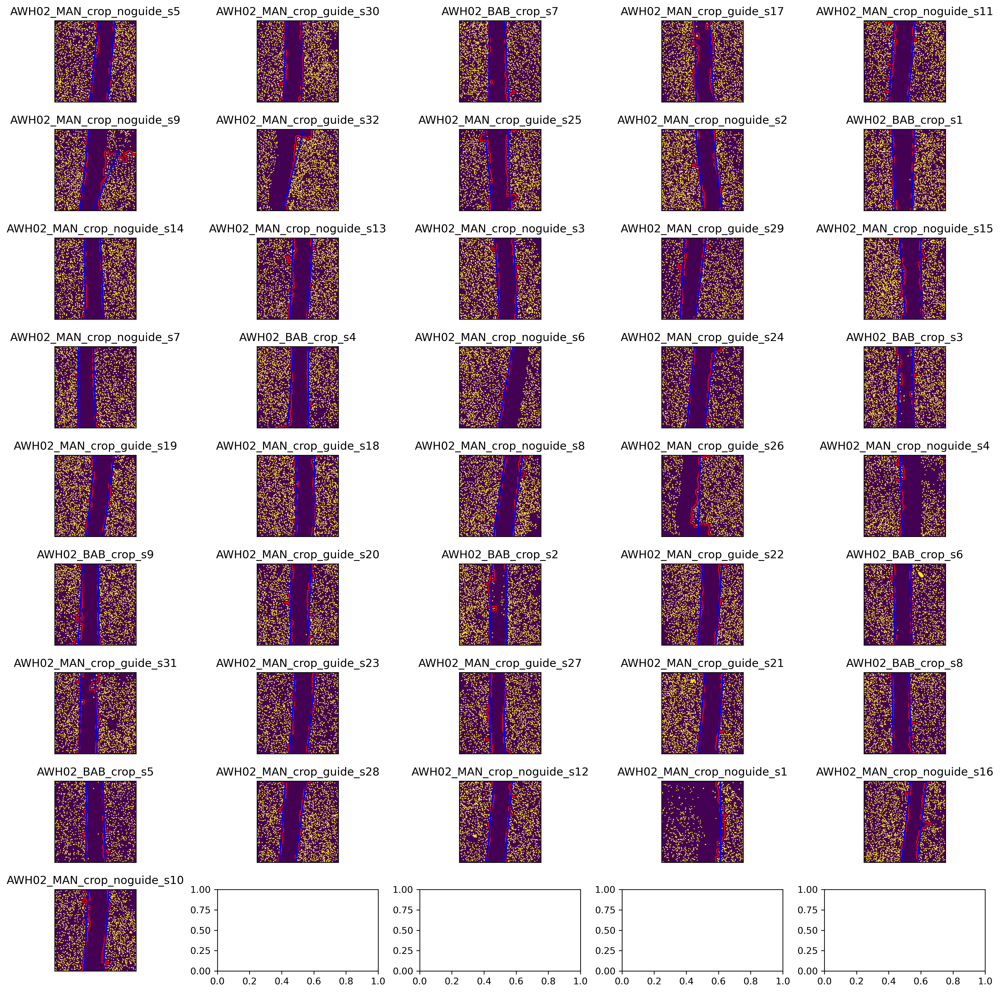

In [5]:
#----------------------------------------------------------------------
def get_lines_of_best_fit(contours):
    """A function to fit the lines along the contours
    of the wound edge """
    res = [] # data structure to store the results (no matter how many)

    for i, contour in enumerate(contours):
        x = contour[:, 0].reshape(1, -1).T #x coordinate of contour point
        y = contour[:, 1] #y coordinate of contour point

        reg = LinearRegression().fit(x, y)
        y_hat = reg.predict(x)

        """MAKE A DIFFERENT DATA STRUCTURE"""

        vec = np.vstack([contour[:, 0], y_hat])
        
        res.append(vec.T)

    return res
#----------------------------------------------------------------------   

reload(an)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 15
fig, axs = plt.subplots(9, 5)
axs = axs.ravel()


foot = skimage.morphology.square
# t = 60
# q = 40
# dilation = [19, 6]

# t = 30
# q = 20
# dilation = [21, 8]

# t = 80
# q = 60
# dilation = [15, 6]

# t = 80
# q = 50
t = 80
q = 50
dilation = [19, 6]

all_data = {}
contour = {}
best_fit_line = {}


for i, (label, image) in enumerate(segments.items()):
    wound = an.get_wound_area(image, 
                              foot, 
                              t=t, # small object
                              q=q, # small hole
                              dilation=dilation)

    contours = skimage.measure.find_contours(wound)#, fully_connected='high')
    best_fit_lines = get_lines_of_best_fit(contours)
    
    contour[label] = contours
    best_fit_line[label] = best_fit_lines
    
    axs[i].imshow(image, vmin=0, vmax=1, cmap="viridis")
    axs[i].set_title(label)
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    
    for j in contours:
        axs[i].plot(j[:, 1], j[:, 0], linewidth=1, color='r')

        x = j[:, 0].reshape(1, -1).T
        y = j[:, 1]

        reg = LinearRegression().fit(x, y)
        y_hat = reg.predict(x)
        y_hat.shape
        axs[i].plot(y_hat, x, color='b')
        

    all_data[label] = {
        'image' : imgs[label],
        'segmentations' : segments[label],
        'wound' : wound,
        'contours' : contours,
        'best_fit_lines' : best_fit_lines,
    }

    
plt.tight_layout()

In [6]:
print(len(all_data))

#For edge_var
removals = ['AWH02_MAN_crop_noguide_s9']

# removals = ['AWH02_MAN_crop_guide_s32',
#             'AWH02_MAN_crop_noguide_s6',
#             'AWH02_MAN_crop_noguide_s4',
#             'AWH02_MAN_crop_guide_s26',
#             'AWH02_MAN_crop_noguide_s1',
#             'AWH02_MAN_crop_noguide_s9',
#            ]
    
    
    # 'AWH02_MAN_crop_guide_s17',
    #         'AWH02_MAN_crop_noguide_s6',
    #         'AWH02_MAN_crop_noguide_s4',
    #         # 'AWH02_MAN_crop_guide_s29',
    #         # 'AWH02_MAN_crop_guide_s24',
    #         'AWH02_MAN_crop_guide_s31',
    #         #'AWH02_MAN_crop_guide_s23',
    #         'AWH02_MAN_crop_noguide_s1',
    #        ]

for item in removals:
    del all_data[item]
    
print(len(all_data))

41
40


In [7]:
res = []

for image_name, image_data in all_data.items():
    # print(image_name)

    n_cont = len(image_data['contours'])

    subres = []

    for i in range(n_cont):

        # extract the contour and the corresponding bf line
        cdf = pd.DataFrame(image_data['contours'][i], 
                           columns=['y', 'x'])
        
        cdf['x_centered'] = cdf['x'] - cdf['x'].mean()
        
        cdf['coord_type'] = 'contour'
        
        
        
        ldf = pd.DataFrame(image_data['best_fit_lines'][i], 
                           columns=['y', 'x'])
        
        ldf['x_centered'] = ldf['x'] - ldf['x'].mean()
        
        ldf['coord_type'] = 'bf_line'

        # combine them (stacked row-wise, with a column to 
        # tease them apart
        tmp = pd.concat([cdf, ldf])
        tmp['contour'] = i
        subres.append(tmp)

    # combine data from all contours
    subres = pd.concat(subres)

    # add information from the image
    subres['image_name'] = image_name
    subres['condition'] = image_name.split("_")[1]

    # compile across images 
    res.append(subres)   


res = pd.concat(res)
edge_map = {
    0 : 'left',
    1 : 'right',
}

res['wound_edge'] = res['contour'].map(edge_map)

microns = 5.448 #scaling factor

res['x_cent_scaled'] = (abs(res['x_centered']))*microns
res['x_scaled'] = res['x']*microns

print(f"{res.shape=}")
#res.head()

res.head()

res.shape=(136428, 10)


,y,x,x_centered,coord_type,contour,image_name,condition,wound_edge,x_cent_scaled,x_scaled
0,599.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972
1,598.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972
2,597.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972
3,596.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972
4,595.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972


In [ ]:
# cont2 = res[res['contour'] == 2]
# print(f"{cont2.shape=}")
# cont2.head(50)


res.loc[((res['y'] == 0.0) & (res['image_name'] == 'AWH02_MAN_crop_noguide_s5') & (res['wound_edge'] == 'left')), 'x']


In [33]:
res.to_csv("WH_BABvsMAN.csv")

## Straightness of wound

In [8]:
bf = res[res['coord_type'] == 'bf_line']

bf.head()


slope_data = bf.groupby(['image_name', 'wound_edge']).apply(lambda x: np.polyfit(x['y'], x['x'], 1)[0])        
slopes = slope_data.reset_index(name='slope')
print(f"{slopes.shape=}")
slopes.head()

slopes.shape=(75, 3)


,image_name,wound_edge,slope
0,AWH02_BAB_crop_s1,left,0.041920
1,AWH02_BAB_crop_s1,right,-0.030516
2,AWH02_BAB_crop_s2,left,-0.029012
3,AWH02_BAB_crop_s2,right,0.001224
4,AWH02_BAB_crop_s3,left,-0.029936


In [27]:
s5 = slopes[slopes['image_name'] == 'AWH02_MAN_crop_noguide_s5']

s5.head()

,image_name,wound_edge,slope
68,AWH02_MAN_crop_noguide_s5,left,-9.301066
69,AWH02_MAN_crop_noguide_s5,right,-11.327592


In [24]:
bf.loc[((bf['y'] == 0.0) & (bf['image_name'] == 'AWH02_MAN_crop_noguide_s5') & (bf['wound_edge'] == 'left')), 'x']



923    323.284791
Name: x, dtype: float64

In [25]:
(599 - 0)/(258.884 - 323.285)

-9.30109780904023

In [28]:
(0 - 599)/(323.285 - 258.884)

-9.30109780904023

In [9]:
for i, image_name in enumerate(slopes['image_name']):
    if image_name.startswith('AWH02_BAB'):
        slopes.at[i, 'condition'] = 'BAB'
    else:
        slopes.at[i, 'condition'] = 'MAN'
        

slopes['abs_val'] = abs(slopes['slope'])

slopes.head()


,image_name,wound_edge,slope,condition,abs_val
0,AWH02_BAB_crop_s1,left,0.041920,BAB,0.041920
1,AWH02_BAB_crop_s1,right,-0.030516,BAB,0.030516
2,AWH02_BAB_crop_s2,left,-0.029012,BAB,0.029012
3,AWH02_BAB_crop_s2,right,0.001224,BAB,0.001224
4,AWH02_BAB_crop_s3,left,-0.029936,BAB,0.029936


In [10]:
# slopes.groupby(['condition', 'wound_edge'])['slope'].describe()
slopes.groupby('condition')['abs_val'].describe()

,count,mean,std,min,25%,50%,75%,max
condition,,,,,,,,
BAB,18.0,0.026785,0.019993,0.001224,0.008992,0.027189,0.037645,0.074389
MAN,57.0,0.068362,0.051328,0.000732,0.027259,0.067314,0.095336,0.259622


In [32]:
bf_left = bf[bf['wound_edge'] == 'left']

bf_grouped = bf_left.groupby('image_name')

bf_grouped['bottom_x'] = bf_grouped['x_scaled'].where(bf_grouped['y'] == 599.0)#, ['x_scaled'])

# for i in bf_left['image_name'].unique():
#     # if bf['wound_edge'] == 'left':
#     bottom_x = bf_left['x_scaled'].where(bf_left['y'] == 599.0)#, ['x_scaled'])
#     print(bottom_x)
#     break
    
    #bf['dist'] = bf['x_scaled'] - bottom_x



# bf_grouped = bf.groupby(['image_name', 'wound_edge'])

# bf['bottom_x'] = bf['x_scaled'] - bf_grouped['x_scaled'] if (bf['y'] == 599.0)


#bf['bottom_x'] = bf.groupby(['image_name', 'wound_edge']).apply(bf['x_scaled'] - (bf['x_scaled'].where(bf['y'] == 599.0)))

bf_grouped.head()

AttributeError: 'SeriesGroupBy' object has no attribute 'where'

In [17]:
#bf['bottom_x'] = bf.groupby(['image_name', 'wound_edge'])['x_scaled'].where(bf['y'] == 599.0)


#bf.groupby(['image_name', 'wound_edge'])

bf.head()
# bf['bottom_x'] = bf.groupby(['image_name', 'wound_edge'])

,y,x,x_centered,coord_type,contour,image_name,condition,wound_edge,x_cent_scaled,x_scaled
0,599.0,258.883573,-31.384825,bf_line,0,AWH02_MAN_crop_noguide_s5,MAN,left,170.984525,1410.397708
1,598.0,258.991088,-31.277310,bf_line,0,AWH02_MAN_crop_noguide_s5,MAN,left,170.398786,1410.983448
2,597.0,259.098603,-31.169796,bf_line,0,AWH02_MAN_crop_noguide_s5,MAN,left,169.813047,1411.569187
3,596.0,259.206117,-31.062281,bf_line,0,AWH02_MAN_crop_noguide_s5,MAN,left,169.227308,1412.154926
4,595.0,259.313632,-30.954767,bf_line,0,AWH02_MAN_crop_noguide_s5,MAN,left,168.641568,1412.740665


# Distance from wound edge

In [42]:
cont = res[res['coord_type'] == 'contour']
bf = res[res['coord_type'] == 'bf_line']

res_vars = pd.merge(cont, bf,
                    how='left',
                    left_on=['y', 'image_name', 'condition', 'wound_edge'],
                    right_on=['y', 'image_name', 'condition', 'wound_edge'])


res_vars['edge_var'] = abs(res_vars['x_scaled_x'] - res_vars['x_scaled_y'])

res_vars.head()

,y,x_x,x_centered_x,coord_type_x,contour_x,image_name,condition,wound_edge,x_cent_scaled_x,x_scaled_x,x_y,x_centered_y,coord_type_y,contour_y,x_cent_scaled_y,x_scaled_y,edge_var
0,599.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972,258.883573,-31.384825,bf_line,0,170.984525,1410.397708,176.425708
1,598.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972,258.991088,-31.277310,bf_line,0,170.398786,1410.983448,177.011448
2,597.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972,259.098603,-31.169796,bf_line,0,169.813047,1411.569187,177.597187
3,596.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972,259.206117,-31.062281,bf_line,0,169.227308,1412.154926,178.182926
4,595.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972,259.313632,-30.954767,bf_line,0,168.641568,1412.740665,178.768665


In [43]:
res_vars.groupby('condition')['edge_var'].describe()

,count,mean,std,min,25%,50%,75%,max
condition,,,,,,,,
BAB,63452.0,56.256697,51.262168,0.000079,19.278413,42.690439,77.667288,354.104259
MAN,228556.0,69.256617,66.674370,0.000651,23.139809,50.580094,93.181704,479.122798


In [21]:
avgs = res_vars.groupby('image_name')['edge_var'].mean()


avgs.shape

(36,)

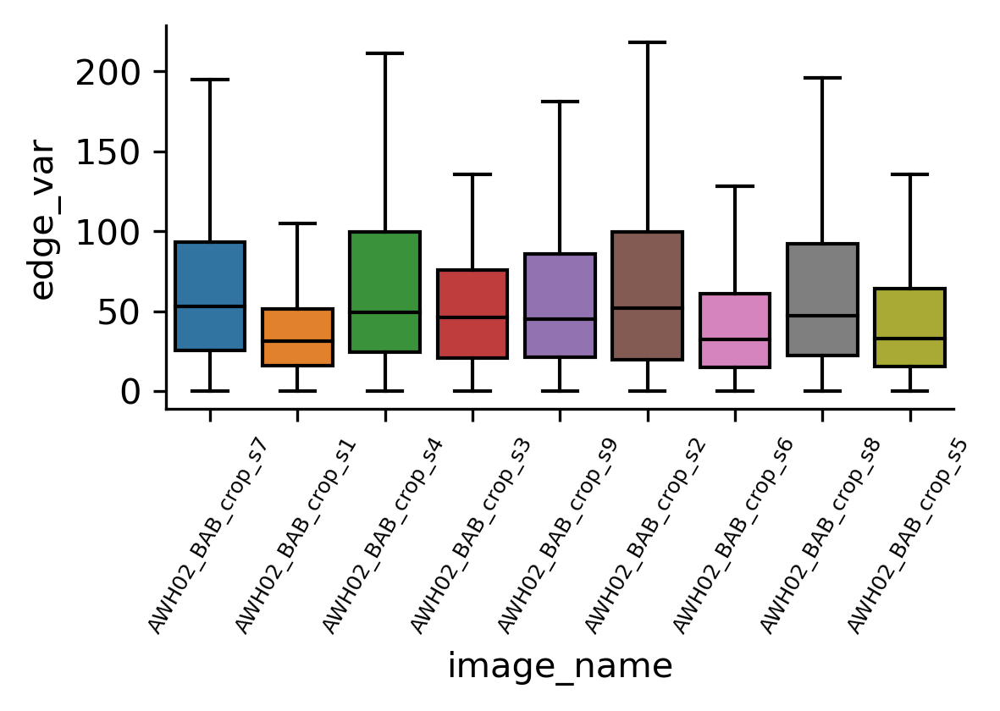

In [44]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 2

props = {'boxprops': {'edgecolor':'black'},
         'medianprops': {'color':'black'},
         'whiskerprops': {'color':'black'},
         'capprops': {'color':'black'}}

BAB = res_vars[res_vars['condition'] == 'BAB']
MAN = res_vars[res_vars['condition'] == 'MAN']


sns.boxplot(data=BAB, 
            x='image_name',
            y= 'edge_var',
            #hue='wound_edge',
            showfliers=False,
            linewidth=1,
            **props,
            #palette=colors,
)

plt.legend([], [], frameon=False)
plt.xticks(rotation=60, fontsize=6)

sns.despine()

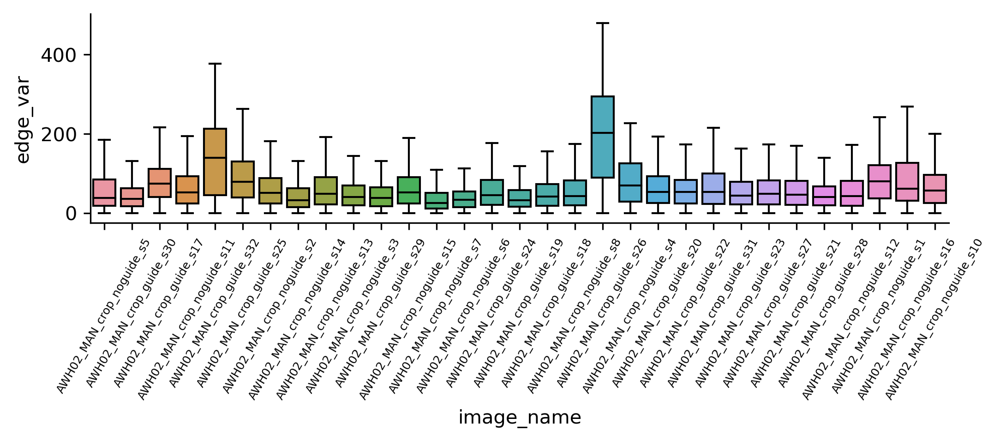

In [45]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 2

props = {'boxprops': {'edgecolor':'black'},
         'medianprops': {'color':'black'},
         'whiskerprops': {'color':'black'},
         'capprops': {'color':'black'}}

BAB = res_vars[res_vars['condition'] == 'BAB']
MAN = res_vars[res_vars['condition'] == 'MAN']


sns.boxplot(data=MAN, 
            x='image_name',
            y= 'edge_var',
            #hue='wound_edge',
            showfliers=False,
            linewidth=1,
            **props,
            #palette=colors,
)

plt.legend([], [], frameon=False)
plt.xticks(rotation=60, fontsize=6)

sns.despine()

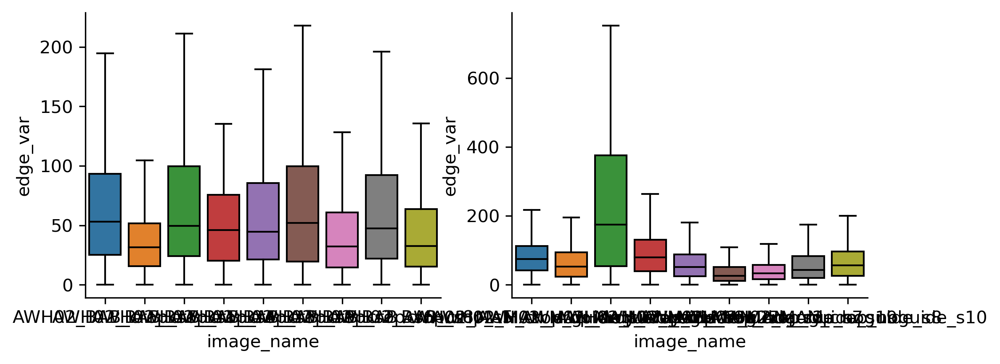

In [45]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 8, 3
fig, axs = plt.subplots(1, 2)#, sharey=True)

#plot = "contour"
# plot = "bf_line"
# mask = (res['coord_type'] == plot)

props = {'boxprops': {'edgecolor':'black'},
         'medianprops': {'color':'black'},
         'whiskerprops': {'color':'black'},
         'capprops': {'color':'black'}}

BAB = res_vars[res_vars['condition'] == 'BAB']
MAN = res_vars[res_vars['condition'] == 'MAN']

random9 = MAN['image_name'].sample(9).unique()


random9
MAN_rand = MAN[MAN['image_name'].isin(random9)].copy()

#MAN_rand.head()

#colors = ['lightgrey', 'seagreen']

sns.boxplot(data=BAB, 
            x='image_name',
            y= 'edge_var',
            #hue='wound_edge',
            showfliers=False,
            linewidth=1,
            **props,
            ax=axs[0],
            #palette=colors,
)

sns.boxplot(data=MAN_rand, 
            x='image_name',
            y= 'edge_var',
            #hue='wound_edge',
            showfliers=False,
            linewidth=1,
            **props,
            ax=axs[1],
            #palette=colors,
)

sns.despine()

# sns.move_legend(plt.gca(), 
#                 title="",
#                 loc='upper right',
#                 bbox_to_anchor=(1.5, 1))

# plt.ylabel('X Coordinate (um)')
# plt.xlabel('Wound Edge')
# plt.gca().set_xticklabels(['Left', 'Right'])


plt.legend([], [], frameon=False)

#res_vars.groupby(['condition', 'image_name','wound_edge')['edge_var'].mean()

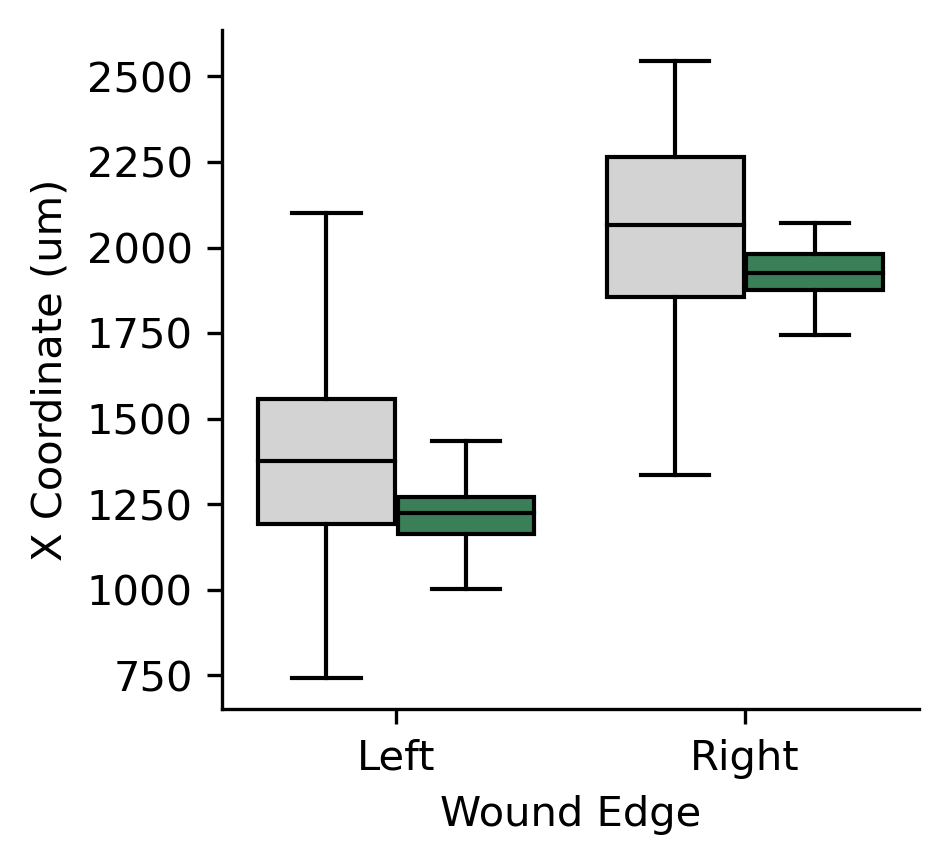

In [46]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3
#fig, axs = plt.subplots(1, 2)

#plot = "contour"
plot = "bf_line"
mask = (res['coord_type'] == plot)

props = {'boxprops': {'edgecolor':'black'},
         'medianprops': {'color':'black'},
         'whiskerprops': {'color':'black'},
         'capprops': {'color':'black'}}

colors = ['lightgrey', 'seagreen']

sns.boxplot(data=res[mask], 
            x='wound_edge',
            y='x_scaled',
            hue='condition',
            showfliers=False,
            linewidth=1,
            **props,
            palette=colors,
)

sns.despine()

sns.move_legend(plt.gca(), 
                title="",
                loc='upper right',
                bbox_to_anchor=(1.5, 1))

plt.ylabel('X Coordinate (um)')
plt.xlabel('Wound Edge')
plt.gca().set_xticklabels(['Left', 'Right'])


plt.legend([], [], frameon=False)

In [47]:
res.groupby(['condition', 'coord_type', 'wound_edge'])['x_scaled'].describe()


count         mean         std  \
condition coord_type wound_edge                                     
BAB       bf_line    left         7995.0  1219.666486  110.793649   
                     right        7959.0  1921.752395   85.181992   
          contour    left         7995.0  1219.666486  131.486352   
                     right        7959.0  1921.752395  101.348074   
MAN       bf_line    left        29204.0  1392.080594  312.623345   
                     right       23031.0  2045.993076  249.441451   
          contour    left        29204.0  1392.080594  324.555764   
                     right       23031.0  2045.993076  258.640972   

                                         min          25%          50%  \
condition coord_type wound_edge                                          
BAB       bf_line    left         942.063940  1164.151126  1223.154868   
                     right       1743.810706  1876.736184  1926.289337   
          contour    left         694.620000  1152.252000  1212.180000   
                     right       1707.948000  1852.320000  1914.972000   
MAN       bf_line    left         741.363357  1192.659339  1376.099182   
                     right       1336.495331  1856.202061  2067.105686   
          contour    left         634.692000  1179.492000  1386.516000   
                     right       1283.004000  1849.596000  2075.688000   

                                         75%          max  
condition coord_type wound_edge                            
BAB       bf_line    left        1271.847035  1465.590760  
                     right       1979.862095  2071.999301  
          contour    left        1304.796000  1528.164000  
                     right       1991.244000  2274.540000  
MAN       bf_line    left        1555.994165  2368.294080  
                     right       2265.522790  2546.215019  
          contour    left        1555.404000  2601.420000  
                     right       2252.748000  2764.860000

In [117]:
res_left = res[(res['wound_edge'] == 'left')]# & (res['coord_type'] == 'bf_line')]#.reset_index()
res_right = res[(res['wound_edge'] == 'right')]# & (res['coord_type'] == 'bf_line')]#.reset_index()

res_widths = pd.merge(res_left, res_right,
                      how='left',
                      left_on=['y', 'image_name', 'condition', 'coord_type'],
                      right_on=['y', 'image_name', 'condition', 'coord_type'])

res_widths['width'] = (res_widths['x_scaled_y'] - res_widths['x_scaled_x'])

res_widths.head()

,y,x_x,x_centered_x,coord_type,contour_x,image_name,condition,wound_edge_x,x_cent_scaled_x,x_scaled_x,x_y,x_centered_y,contour_y,wound_edge_y,x_cent_scaled_y,x_scaled_y,width
0,599.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972,398.5,-18.080723,1.0,right,98.503778,2171.028,937.056
1,598.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972,398.5,-18.080723,1.0,right,98.503778,2171.028,937.056
2,597.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972,398.5,-18.080723,1.0,right,98.503778,2171.028,937.056
3,596.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972,398.5,-18.080723,1.0,right,98.503778,2171.028,937.056
4,595.0,226.5,-63.768398,contour,0,AWH02_MAN_crop_noguide_s5,MAN,left,347.410234,1233.972,398.5,-18.080723,1.0,right,98.503778,2171.028,937.056


In [118]:
res_widths.groupby(['condition', 'coord_type'])['width'].describe()

count        mean         std         min         25%  \
condition coord_type                                                            
BAB       bf_line      6809.0  698.716253   77.033518  509.287978  649.358018   
          contour      6809.0  691.107884  113.299381  359.568000  626.520000   
MAN       bf_line     21679.0  730.411180  106.056757  518.310170  678.436997   
          contour     21679.0  723.220429  151.359786  343.224000  648.312000   

                             50%         75%          max  
condition coord_type                                       
BAB       bf_line     696.165595  753.783592   905.071511  
          contour     670.104000  746.376000  1214.904000  
MAN       bf_line     724.959014  766.252826  1301.361932  
          contour     697.344000  757.272000  1928.592000

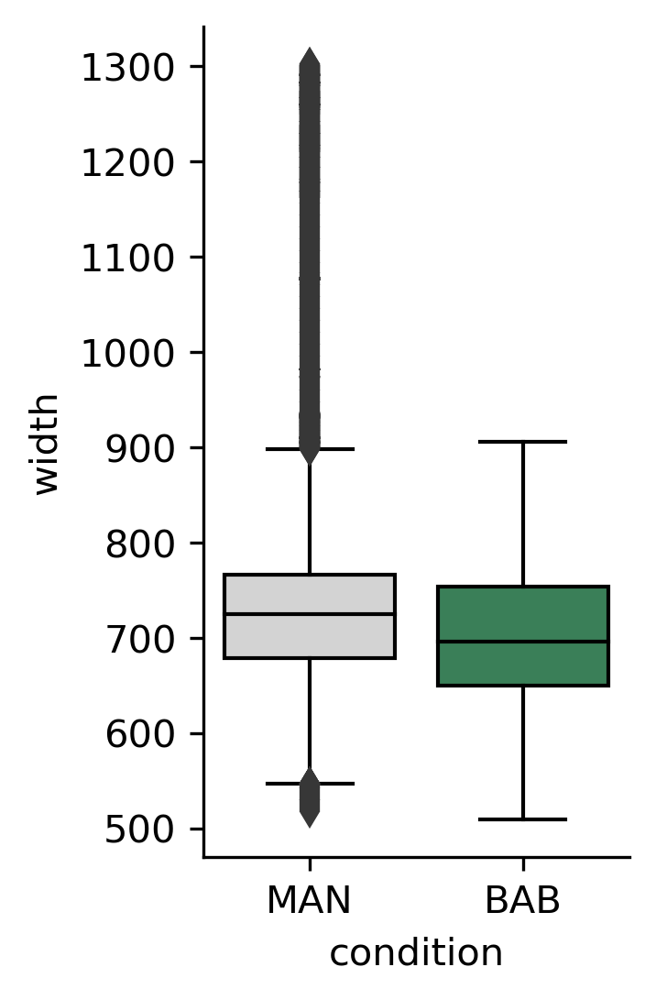

In [121]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2, 4

plot = "bf_line"
mask = (res_widths['coord_type'] == plot)

props = {'boxprops': {'edgecolor':'black'},
         'medianprops': {'color':'black'},
         'whiskerprops': {'color':'black'},
         'capprops': {'color':'black'}}

colors = ['lightgrey', 'seagreen']


sns.boxplot(data=res_widths[mask], 
            x='condition',
            y='width',
            #hue='coord_type',
            #showfliers=False,
            linewidth=1,
            **props,
            palette=colors,
)

sns.despine()

# plt.ylabel('X Coordinate (centered, um)')
# plt.xlabel('Wound Edge')
# plt.gca().set_xticklabels(['Left', 'Right'])

# sns.move_legend(plt.gca(), 
#                 title="",
#                 loc='upper right',
#                 bbox_to_anchor=(1.5, 1))

plt.legend([], [], frameon=False)

In [148]:
# MAN_widths = res_widths[(res_widths['condition'] == 'MAN') & (res_widths['coord_type'] == 'bf_line')]
# BAB_widths = res_widths[(res_widths['condition'] == 'BAB') & (res_widths['coord_type'] == 'bf_line')]

MAN_widths = res_widths[(res_widths['condition'] == 'MAN') & (res_widths['coord_type'] == 'contour')]
BAB_widths = res_widths[(res_widths['condition'] == 'BAB') & (res_widths['coord_type'] == 'contour')]

#scipy.stats.ttest_ind(BAB_widths.dropna()['width'], MAN_widths.dropna()['width'], equal_var=False)

In [149]:
###IQR

Q1 = MAN_widths['width'].quantile(0.25)
Q3 = MAN_widths['width'].quantile(0.75)
IQR = Q3 - Q1

t = 1.5
outliers = MAN_widths[(MAN_widths['width'] < Q1 - t * IQR) | (MAN_widths['width'] > Q3 + t * IQR)]
print(f"{outliers.shape=}")


MAN_widths = MAN_widths.drop(outliers.index)
print(f"{MAN_widths.shape=}")

#------------------------------------------
Q1 = BAB_widths['width'].quantile(0.25)
Q3 = BAB_widths['width'].quantile(0.75)
IQR = Q3 - Q1

t = 1.5
outliers = BAB_widths[(BAB_widths['width'] < Q1 - t * IQR) | (BAB_widths['width'] > Q3 + t * IQR)]
print(f"{outliers.shape=}")


BAB_widths = BAB_widths.drop(outliers.index)
print(f"{BAB_widths.shape=}")

outliers.shape=(1713, 17)
MAN_widths.shape=(27328, 17)
outliers.shape=(359, 17)
BAB_widths.shape=(8444, 17)


In [147]:
print(f"{MAN_widths.shape=}")
z = np.abs(scipy.stats.zscore(MAN_widths['width']))

t = 2
outliers = MAN_widths[z > t]
print(f"{outliers.shape=}")


MAN_widths = MAN_widths.drop(outliers.index)
print(f"{MAN_widths.shape=}")

#------------------------------------------
#BAB
print(f"{BAB_widths.shape=}")
z = np.abs(scipy.stats.zscore(BAB_widths['width']))

t = 2
outliers = BAB_widths[z > t]
print(f"{outliers.shape=}")


BAB_widths = BAB_widths.drop(outliers.index)
print(f"{BAB_widths.shape=}")

MAN_widths.shape=(29041, 17)
outliers.shape=(0, 17)
MAN_widths.shape=(29041, 17)
BAB_widths.shape=(8803, 17)
outliers.shape=(0, 17)
BAB_widths.shape=(8803, 17)


In [150]:
BAB_widths['width'].describe()

count    6450.000000
mean      682.027096
std        89.647051
min       452.184000
25%       631.968000
50%       664.656000
75%       735.480000
max       920.712000
Name: width, dtype: float64

In [151]:
MAN_widths['width'].describe()

count    19966.000000
mean       697.420402
std         83.574171
min        484.872000
25%        648.312000
50%        691.896000
75%        740.928000
max        920.712000
Name: width, dtype: float64

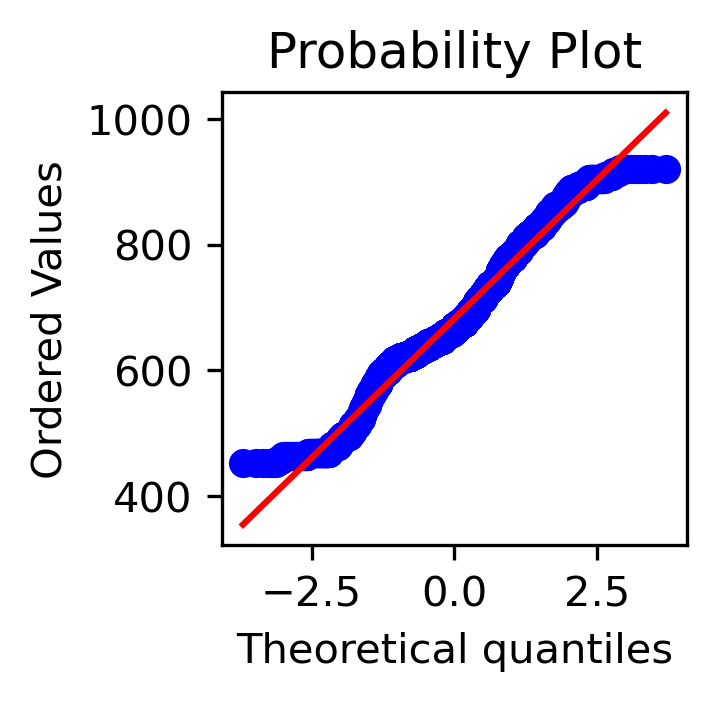

In [152]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2, 2

scipy.stats.probplot(BAB_widths.dropna()['width'], dist='norm', plot=plt)
plt.show()

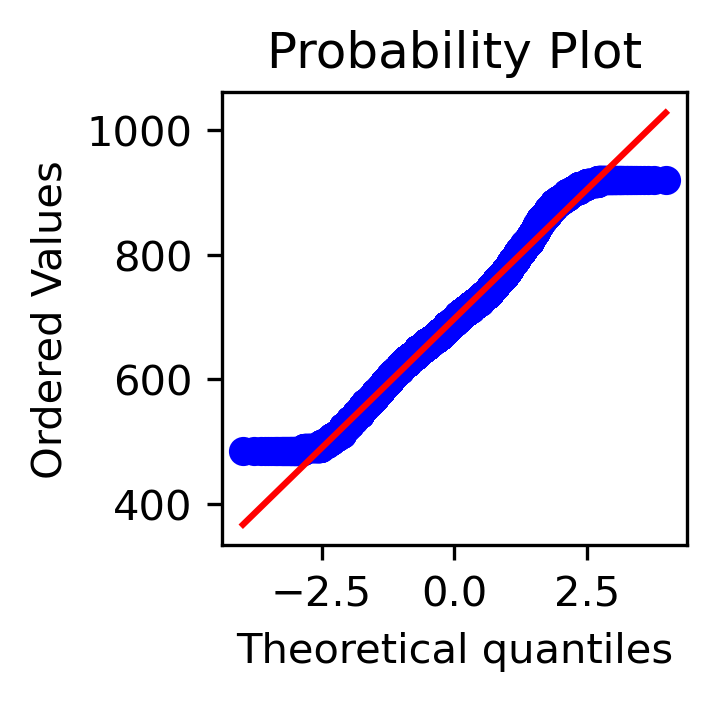

In [153]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2, 2

scipy.stats.probplot(MAN_widths.dropna()['width'], dist='norm', plot=plt)
plt.show()